# Instalando Bibliotecas

In [ ]:
import cv2
import cv2 as cv

import numpy as np
import os
import glob
import pandas as pd
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image
import matplotlib.pylab as plt
!pip install mahotas
import mahotas as mt

# Carregando imagens para testar

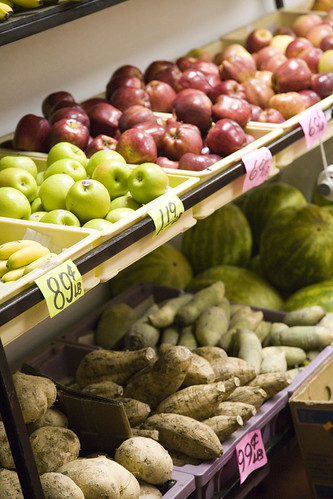

In [ ]:
image = io.imread('http://farm3.static.flickr.com/2225/2062534589_7e473b108c.jpg')
cv2_imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# Algumas informações das imagens

In [ ]:
print('Altura: ',image.shape[0])
print('Largura: ',image.shape[1])
print('#Canais: ', image.shape[2])

Altura:  499
Largura:  333
#Canais:  3


# Extraindo Descritores via Textura de Haralick


In [ ]:
def extract_features(image):
        # calculate haralick texture features for 4 types of adjacency
        textures = mt.features.haralick(image)
        ht_mean = textures.mean(axis=0)
        return ht_mean


In [ ]:
extract_features(image)

array([ 9.79400831e-05,  1.51993035e+03,  8.49383440e-01,  5.07417863e+03,
        9.29237106e-02,  2.20056974e+02,  1.87767842e+04,  8.86981274e+00,
        1.44214745e+01,  1.06794753e-04,  5.90607639e+00, -1.79020293e-01,
        9.46718351e-01])

# Coletando o Dataset

In [ ]:
links = ['http://static.flickr.com/9/13803695_ea9f8dfc16.jpg',
'http://farm1.static.flickr.com/43/79256044_1e8945eb82.jpg',
'http://farm4.static.flickr.com/3058/2925112649_2a283607d8.jpg',
'http://farm1.static.flickr.com/206/507474775_da3a48d69b.jpg',
'http://farm3.static.flickr.com/2242/1695888408_940e8dbefc.jpg',
'http://static.flickr.com/1258/910812670_acacab421e.jpg',
'http://farm1.static.flickr.com/176/379081795_c3fa394f6a.jpg',
'http://farm1.static.flickr.com/212/485394549_011a7549e8.jpg',
'http://static.flickr.com/2094/2220184225_b3d09f4738.jpg',
'http://farm1.static.flickr.com/86/227139104_506b4c6b4d.jpg',
'http://farm1.static.flickr.com/7/11202867_c3833d758e.jpg',
'http://farm4.static.flickr.com/3154/3041795338_f9eb506368.jpg',
'http://static.flickr.com/2052/1547494237_4135d64fb1.jpg',
'http://farm1.static.flickr.com/121/290007835_015d1eea4f.jpg',
'http://farm1.static.flickr.com/201/476746478_49dac3bf4b.jpg',
'http://farm3.static.flickr.com/2283/2499880901_a5df4ef867.jpg',
'http://www.natures-desktop.com/images/wallpapers/800x600/landscapes/stone-wall-valley.jpg',
'http://static.flickr.com/145/370604481_3f4ebfde15.jpg',
'http://www.cottagecatalog.com/images/cottage/stonewall.jpg',
'http://farm4.static.flickr.com/3087/2580797907_e28859be95.jpg',
'http://farm3.static.flickr.com/2287/2944334392_6b21776aca.jpg',
'http://farm2.static.flickr.com/1118/1414880730_f40acca42d.jpg',
'http://static.flickr.com/27/45885641_3f421eca11.jpg',
'http://static.flickr.com/3142/3066137591_12ae1bea0e.jpg',
'http://www.chivalry.com/songfest/photos/mary-adi-stonewall.jpg',
'http://farm2.static.flickr.com/1421/1218755515_81f4a603b3.jpg',
'http://www.earthproducts.net/images/stonewall.jpg',
'http://static.flickr.com/2329/2050591096_1c4d78fa60.jpg',
'http://farm4.static.flickr.com/3026/2618945681_fd7519c121.jpg',
'http://farm4.static.flickr.com/3083/3130777027_7cb1d6a6de.jpg',
'http://static.flickr.com/157/329508488_ffe1af9ab0.jpg',
'http://www.trueelena.org/arcr/wallpapers/img/stone_wall_1-800x480.jpg',
'http://farm4.static.flickr.com/3023/2919866515_990401b96c.jpg',
'http://www.ravelgrane.com/pix/places/200310_Lechworth/087_stone_wall.jpg',
'http://farm1.static.flickr.com/176/441616466_54ef1527ee.jpg',
'http://farm1.static.flickr.com/202/510010947_0b8563a369.jpg',
'http://farm4.static.flickr.com/3219/2939899060_af5f0c4fba.jpg',
'http://lazykitty.net/irelandBN/original/08.%20Close%20up%20of%20a%20stone%20wall.jpg',
'http://farm4.static.flickr.com/3194/2581434695_cd8d46e8d2.jpg',
'http://ts11.brightqube.com/images/l/000/657/000657159.jpg',
'http://farm1.static.flickr.com/41/77752066_94fd0f8838.jpg',
'http://farm2.static.flickr.com/1228/758266377_e8afad1c9e.jpg',
'http://farm4.static.flickr.com/3113/2760382905_d13b4dbaf3.jpg',
'http://static.flickr.com/1156/1466297536_2e805003ca.jpg',
'http://farm3.static.flickr.com/2177/2252911907_70b98cdacc.jpg',
'http://farm4.static.flickr.com/3022/2633843071_e41c29bc49.jpg',
'http://static.flickr.com/2242/2413140109_9f7218f2a7.jpg',
'http://farm1.static.flickr.com/4/9262278_338e7f2bc8.jpg',
'http://farm1.static.flickr.com/30/53328264_eab6256e01.jpg',
'http://farm1.static.flickr.com/28/100934807_02e4d7a8a5.jpg',
'http://farm4.static.flickr.com/3027/3138359327_974d1959e9.jpg',
'http://farm4.static.flickr.com/3264/2634647776_7e856c3ef0.jpg',
'http://farm3.static.flickr.com/2306/2372746612_4d4207bfdf.jpg',
'http://farm1.static.flickr.com/202/513244698_429e5257ce.jpg',
'http://farm2.static.flickr.com/1086/1192125566_e1c4cfbf88.jpg']

# Gerando o dataset

In [ ]:
dataset = []
for img_url in links:
  try:
    image = io.imread(img_url)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    dataset.append(image)
  except:
    print('Warning: ',img_url)

<ipython-input-8-ed0f90448126>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(dataset) / columns + 1), columns, i + 1)


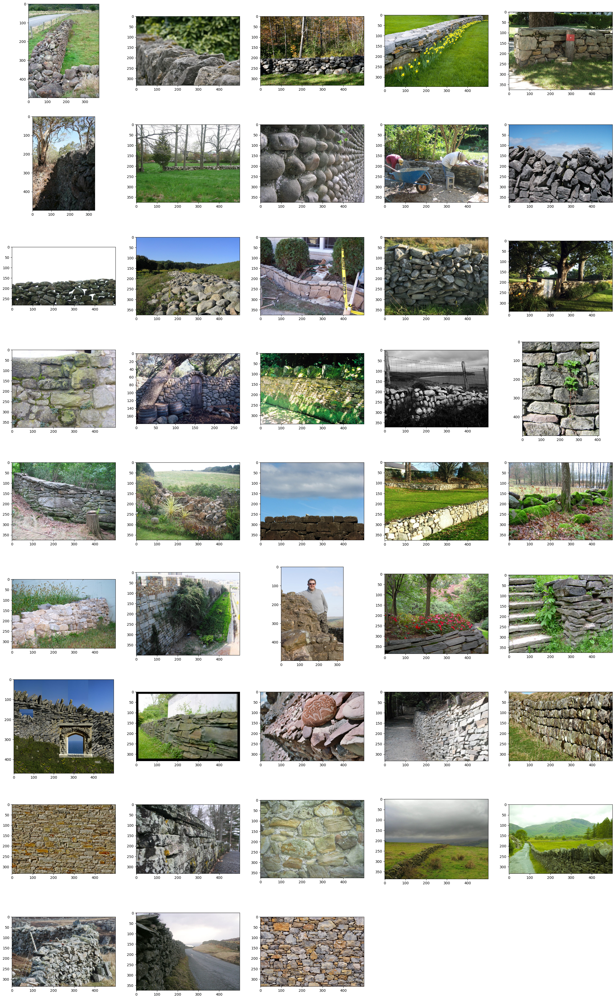

In [ ]:
plt.subplots(figsize=(30,50))
columns = 5
for i, image in enumerate(dataset):
    plt.subplot(int(len(dataset) / columns + 1), columns, i + 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

In [ ]:
len(dataset)

43

# Pré-processando via Descritores de Texturas

In [ ]:
X = []
for image in dataset:
  textures = extract_features(image)
  X.append(textures)

In [ ]:
import pandas as pd
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.000049,1736.191286,0.647924,2469.979331,0.040853,273.344269,8143.726037,8.520778,14.738804,0.000047,6.354834,-0.074549,0.799595
1,0.000111,593.664287,0.869954,2297.205505,0.091033,190.752082,8595.157733,8.520574,13.771439,0.000118,5.441457,-0.181317,0.951147
2,0.000104,2444.299258,0.651025,3504.327233,0.046542,168.162391,11573.009673,8.638531,14.806005,0.000039,6.593420,-0.070360,0.793495
3,0.000060,3667.387006,0.489466,3647.493276,0.038374,203.654303,10922.586098,8.533073,14.726970,0.000043,6.655041,-0.101714,0.846777
4,0.000239,932.094080,0.860704,3349.825487,0.073732,176.588964,12467.207866,8.472999,14.032927,0.000078,5.843880,-0.136854,0.925055
5,0.000141,1178.482829,0.890306,5371.483560,0.081509,190.409714,20307.451412,8.725319,14.126649,0.000086,5.888690,-0.174310,0.959674
6,0.000782,1933.649175,0.802837,4963.550534,0.086647,253.570076,17920.552963,8.288388,13.844344,0.000064,6.233461,-0.141905,0.923420
7,0.000156,488.537222,0.886411,2150.572160,0.111890,211.583937,8113.751419,8.440481,13.442625,0.000152,5.155900,-0.202044,0.968920
8,0.000073,1772.560895,0.749741,3537.973036,0.064368,216.146924,12379.331248,8.631817,14.571410,0.000064,6.213628,-0.106498,0.884627
9,0.000160,1410.580712,0.838082,4371.675122,0.125520,243.223975,16076.119775,8.700491,13.857528,0.000122,5.823657,-0.217298,0.974553


In [ ]:
np.array(X).shape

(43, 13)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.000000,0.432893,0.323458,0.133936,0.015776,0.626955,0.101680,0.906738,0.972257,0.008627,0.885112,0.916818,0.401415
1,0.000187,0.097384,0.776686,0.110589,0.101921,0.278348,0.116723,0.906692,0.857211,0.062930,0.627535,0.562055,0.865800
2,0.000167,0.640833,0.329789,0.273709,0.025543,0.183001,0.215958,0.933091,0.980249,0.002611,0.952395,0.930735,0.382723
3,0.000033,1.000000,0.000000,0.293055,0.011520,0.332806,0.194283,0.909490,0.970850,0.005754,0.969773,0.826555,0.545991
4,0.000579,0.196766,0.757804,0.252831,0.072221,0.218568,0.245756,0.896045,0.888309,0.032138,0.741021,0.709794,0.785851
5,0.000280,0.269119,0.818231,0.526019,0.085570,0.276903,0.507026,0.952514,0.899455,0.038695,0.753657,0.585337,0.891928
6,0.002242,0.490878,0.639682,0.470894,0.094392,0.543492,0.427484,0.854730,0.865881,0.021505,0.850885,0.693011,0.780841
7,0.000327,0.066513,0.810279,0.090775,0.137726,0.366276,0.100681,0.888768,0.818106,0.088934,0.547007,0.493182,0.920261
8,0.000073,0.443573,0.531297,0.278255,0.056144,0.385535,0.242828,0.931588,0.952349,0.021994,0.845292,0.810659,0.661971
9,0.000339,0.337276,0.711626,0.390914,0.161125,0.499823,0.366020,0.946957,0.867449,0.066061,0.735318,0.442497,0.937521


# Agrupamento com K-Means

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

kmeans = KMeans(n_clusters=10).fit(X)
kmeans.labels_


array([8, 4, 2, 2, 0, 7, 9, 4, 8, 7, 1, 0, 0, 0, 5, 4, 0, 9, 3, 9, 8, 0,
       6, 9, 8, 0, 7, 6, 5, 8, 5, 7, 4, 7, 2, 2, 4, 8, 6, 7, 0, 3, 8],
      dtype=int32)

1


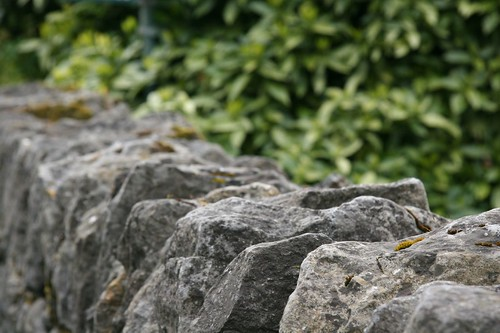

7


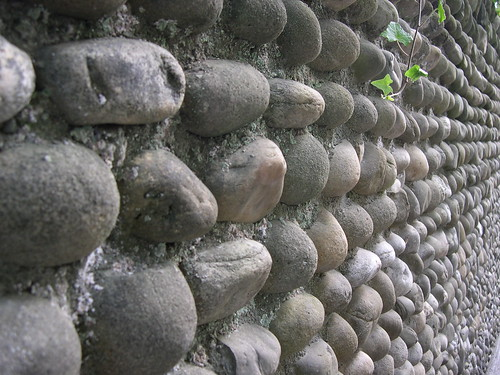

15


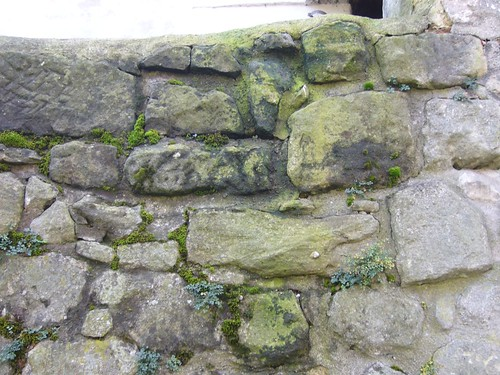

32


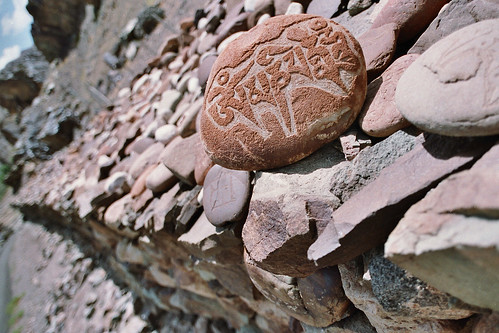

36


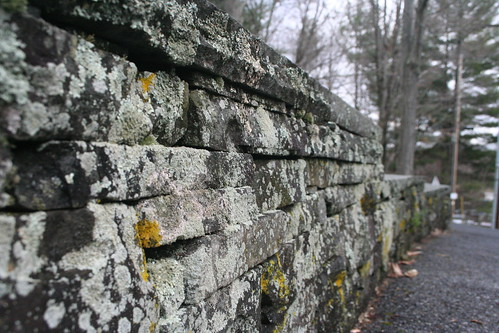

In [ ]:
# visualizando o cluster k
cluster_k = 4
for image_id, cluster in enumerate(kmeans.labels_):
    if cluster == cluster_k:
      print(image_id)
      cv2_imshow(dataset[image_id])

# Classificação de Imagens

In [ ]:
!wget https://people.csail.mit.edu/torralba/code/spatialenvelope/spatial_envelope_256x256_static_8outdoorcategories.zip

--2024-09-27 13:50:11--  https://people.csail.mit.edu/torralba/code/spatialenvelope/spatial_envelope_256x256_static_8outdoorcategories.zip
Resolving people.csail.mit.edu (people.csail.mit.edu)... 128.52.131.233
Connecting to people.csail.mit.edu (people.csail.mit.edu)|128.52.131.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 135033638 (129M) [application/zip]
Saving to: ‘spatial_envelope_256x256_static_8outdoorcategories.zip’

spatial_envelope_25 100%[===================>] 128.78M  15.2MB/s    in 9.7s    

2024-09-27 13:50:22 (13.3 MB/s) - ‘spatial_envelope_256x256_static_8outdoorcategories.zip’ saved [135033638/135033638]



In [ ]:
!unzip spatial_envelope_256x256_static_8outdoorcategories.zip

Archive:  spatial_envelope_256x256_static_8outdoorcategories.zip
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_arnat59.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_art1130.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_art294.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_art487.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_bea1.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_bea10.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_bea14.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_bea2.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_bea20.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_bea24.jpg  
  inflating: spatial_envelope_256x256_static_8outdoorcategories/coast_bea26.jpg  
  inflating: spatial_envelope

In [ ]:
!rm spatial_envelope_256x256_static_8outdoorcategories/Thumbs.db

In [ ]:
import os

destdir = './spatial_envelope_256x256_static_8outdoorcategories/'

files = [ f for f in os.listdir(destdir) if os.path.isfile(os.path.join(destdir,f)) ]
files

['opencountry_land295.jpg',
 'forest_for42.jpg',
 'mountain_land775.jpg',
 'opencountry_fie8.jpg',
 'street_par203.jpg',
 'coast_natu829.jpg',
 'coast_nat479.jpg',
 'mountain_sharp72.jpg',
 'street_par9.jpg',
 'insidecity_art646.jpg',
 'highway_gre42.jpg',
 'opencountry_urb969.jpg',
 'street_urb274.jpg',
 'mountain_n213048.jpg',
 'street_par18.jpg',
 'street_a205062.jpg',
 'opencountry_open61.jpg',
 'mountain_nat760.jpg',
 'mountain_sharp5.jpg',
 'coast_nat1091.jpg',
 'highway_bost177.jpg',
 'opencountry_open12.jpg',
 'highway_n480070.jpg',
 'insidecity_artc8.jpg',
 'mountain_moun37.jpg',
 'tallbuilding_art232.jpg',
 'street_art793.jpg',
 'opencountry_natu532.jpg',
 'forest_for52.jpg',
 'insidecity_art700.jpg',
 'highway_gre536.jpg',
 'opencountry_land952.jpg',
 'forest_cdmc359.jpg',
 'tallbuilding_city83.jpg',
 'tallbuilding_art1350.jpg',
 'opencountry_nat618.jpg',
 'mountain_land11.jpg',
 'mountain_natu460.jpg',
 'mountain_natu699.jpg',
 'highway_bost299.jpg',
 'opencountry_land604.j

### Extraindo descritores de textura

In [ ]:
from tqdm.notebook import tqdm

X = []
y_true = []
counter = 0
for image in tqdm(files):
  img_read = io.imread(destdir+'/'+image)
  textures = extract_features(img_read)
  y_true.append(image.split('_')[0])
  X.append(textures)
  counter += 1

  0%|          | 0/2688 [00:00<?, ?it/s]

In [ ]:
X_textura = np.array(X)
X_textura

array([[ 4.45857321e-03,  5.26012154e+03,  3.39286977e-01, ...,
         5.51538940e+00, -3.33488898e-01,  9.91512436e-01],
       [ 2.83280172e-04,  1.34456348e+03,  8.85355622e-01, ...,
         6.06574084e+00, -1.70936320e-01,  9.58404206e-01],
       [ 2.14410880e-04,  1.27970876e+03,  7.25662850e-01, ...,
         5.56250661e+00, -2.35054700e-01,  9.79478690e-01],
       ...,
       [ 2.54374546e-04,  9.66721615e+02,  7.47564973e-01, ...,
         5.79060157e+00, -1.60206136e-01,  9.36915319e-01],
       [ 3.33455221e-04,  9.37578506e+02,  7.81820463e-01, ...,
         5.44651609e+00, -2.41522244e-01,  9.74090917e-01],
       [ 4.91505318e-04,  9.43610393e+02,  8.92932804e-01, ...,
         5.54306983e+00, -2.27087752e-01,  9.74842208e-01]])

In [ ]:
X_textura.shape

(2688, 13)

In [ ]:
y_true

['opencountry',
 'forest',
 'mountain',
 'opencountry',
 'street',
 'coast',
 'coast',
 'mountain',
 'street',
 'insidecity',
 'highway',
 'opencountry',
 'street',
 'mountain',
 'street',
 'street',
 'opencountry',
 'mountain',
 'mountain',
 'coast',
 'highway',
 'opencountry',
 'highway',
 'insidecity',
 'mountain',
 'tallbuilding',
 'street',
 'opencountry',
 'forest',
 'insidecity',
 'highway',
 'opencountry',
 'forest',
 'tallbuilding',
 'tallbuilding',
 'opencountry',
 'mountain',
 'mountain',
 'mountain',
 'highway',
 'opencountry',
 'tallbuilding',
 'opencountry',
 'coast',
 'highway',
 'mountain',
 'street',
 'street',
 'forest',
 'highway',
 'mountain',
 'tallbuilding',
 'opencountry',
 'tallbuilding',
 'street',
 'street',
 'mountain',
 'coast',
 'insidecity',
 'forest',
 'forest',
 'highway',
 'insidecity',
 'street',
 'tallbuilding',
 'tallbuilding',
 'coast',
 'tallbuilding',
 'tallbuilding',
 'opencountry',
 'street',
 'street',
 'opencountry',
 'insidecity',
 'coast',
 

### Extraindo descritores de cores (histograma)

In [ ]:
color = ('b','g','r')
dataset_hist_r = []
dataset_hist_g = []
dataset_hist_b = []

for image in tqdm(files):
  img_read = io.imread(destdir+'/'+image)
  image_rgb = cv.cvtColor(img_read, cv.COLOR_BGR2RGB)

  hists = {}
  for i,col in enumerate(color):
    histr = cv.calcHist([image_rgb],[i],None,[4],[0,256])
    if col == 'r': dataset_hist_r.append(histr)
    if col == 'g': dataset_hist_g.append(histr)
    if col == 'b': dataset_hist_b.append(histr)

X_r = np.array(dataset_hist_r)
X_g = np.array(dataset_hist_g)
X_b = np.array(dataset_hist_b)

X_cores = np.concatenate((X_r,X_g,X_b),axis=1)
X_cores.shape

  0%|          | 0/2688 [00:00<?, ?it/s]

(2688, 12, 1)

In [ ]:
X_cores = X_cores.reshape(2688,12)
X_cores

array([[1.2060e+03, 6.2990e+03, 3.6672e+04, ..., 3.0380e+03, 3.2036e+04,
        1.2000e+01],
       [2.5158e+04, 2.1956e+04, 9.4860e+03, ..., 1.1082e+04, 5.8190e+03,
        1.3909e+04],
       [2.8903e+04, 2.9504e+04, 4.2860e+03, ..., 3.0169e+04, 2.0174e+04,
        7.4880e+03],
       ...,
       [2.3090e+03, 4.3709e+04, 1.9361e+04, ..., 3.9258e+04, 1.4409e+04,
        1.0557e+04],
       [4.7290e+03, 2.4624e+04, 3.5984e+04, ..., 6.0820e+03, 2.6651e+04,
        0.0000e+00],
       [1.7729e+04, 2.8730e+04, 4.0430e+03, ..., 5.5000e+03, 4.7890e+03,
        1.4784e+04]], dtype=float32)

## Classificação usando Texturas

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X_textura, y_true, test_size=0.20, random_state=42)

scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)


neigh = KNeighborsClassifier(n_neighbors=3,metric="cosine")
neigh.fit(X_train, y_train)

KNeighborsClassifier(metric='cosine', n_neighbors=3)

In [ ]:
X_test = scaler.transform(X_test)
y_pred = neigh.predict(X_test)
y_pred

array(['insidecity', 'forest', 'coast', 'opencountry', 'highway', 'coast',
       'tallbuilding', 'mountain', 'forest', 'tallbuilding', 'coast',
       'coast', 'opencountry', 'insidecity', 'tallbuilding',
       'opencountry', 'forest', 'tallbuilding', 'insidecity', 'street',
       'coast', 'coast', 'highway', 'coast', 'coast', 'highway',
       'opencountry', 'mountain', 'tallbuilding', 'forest', 'highway',
       'insidecity', 'opencountry', 'insidecity', 'coast', 'insidecity',
       'mountain', 'coast', 'street', 'highway', 'opencountry', 'forest',
       'forest', 'opencountry', 'coast', 'mountain', 'insidecity',
       'coast', 'street', 'tallbuilding', 'coast', 'tallbuilding',
       'forest', 'forest', 'coast', 'coast', 'tallbuilding', 'forest',
       'street', 'mountain', 'insidecity', 'forest', 'opencountry',
       'insidecity', 'insidecity', 'mountain', 'mountain', 'coast',
       'tallbuilding', 'street', 'coast', 'coast', 'opencountry',
       'street', 'insidecity', '

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       coast       0.36      0.51      0.42        75
      forest       0.69      0.87      0.77        68
     highway       0.50      0.62      0.55        55
  insidecity       0.26      0.34      0.29        56
    mountain       0.30      0.21      0.24        77
 opencountry       0.35      0.23      0.28        74
      street       0.57      0.50      0.53        52
tallbuilding       0.38      0.26      0.31        81

    accuracy                           0.43       538
   macro avg       0.42      0.44      0.42       538
weighted avg       0.42      0.43      0.41       538



## Classificação usando Cores

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X_cores, y_true, test_size=0.20, random_state=42)

scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)


neigh = KNeighborsClassifier(n_neighbors=3,metric="cosine")
neigh.fit(X_train, y_train)

KNeighborsClassifier(metric='cosine', n_neighbors=3)

In [ ]:
X_test = scaler.transform(X_test)
y_pred = neigh.predict(X_test)
y_pred

array(['mountain', 'mountain', 'insidecity', 'highway', 'highway',
       'opencountry', 'mountain', 'coast', 'forest', 'coast', 'mountain',
       'coast', 'mountain', 'insidecity', 'highway', 'highway', 'forest',
       'tallbuilding', 'street', 'street', 'insidecity', 'insidecity',
       'opencountry', 'highway', 'tallbuilding', 'highway', 'forest',
       'forest', 'forest', 'forest', 'highway', 'insidecity', 'coast',
       'tallbuilding', 'highway', 'tallbuilding', 'street', 'coast',
       'opencountry', 'highway', 'insidecity', 'forest', 'forest',
       'forest', 'tallbuilding', 'highway', 'coast', 'coast', 'street',
       'coast', 'tallbuilding', 'insidecity', 'forest', 'forest', 'coast',
       'insidecity', 'forest', 'forest', 'street', 'coast', 'coast',
       'forest', 'highway', 'coast', 'tallbuilding', 'opencountry',
       'tallbuilding', 'coast', 'opencountry', 'street', 'forest',
       'coast', 'coast', 'street', 'tallbuilding', 'tallbuilding',
       'coast', 'mo

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       coast       0.36      0.49      0.42        75
      forest       0.53      0.74      0.62        68
     highway       0.54      0.65      0.59        55
  insidecity       0.28      0.39      0.33        56
    mountain       0.37      0.25      0.29        77
 opencountry       0.42      0.26      0.32        74
      street       0.53      0.60      0.56        52
tallbuilding       0.37      0.19      0.25        81

    accuracy                           0.43       538
   macro avg       0.42      0.45      0.42       538
weighted avg       0.42      0.43      0.41       538



# Classificação Usando Cores E Texturas

In [ ]:
X_cores_texturas = np.concatenate((X_cores,X_textura),axis=1)
X_cores_texturas.shape

(2688, 25)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X_cores_texturas, y_true, test_size=0.20, random_state=42)

scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)


neigh = KNeighborsClassifier(n_neighbors=3,metric="cosine")
neigh.fit(X_train, y_train)

KNeighborsClassifier(metric='cosine', n_neighbors=3)

In [ ]:
X_test = scaler.transform(X_test)
y_pred = neigh.predict(X_test)
y_pred

array(['forest', 'mountain', 'coast', 'opencountry', 'highway',
       'insidecity', 'coast', 'mountain', 'forest', 'mountain',
       'opencountry', 'coast', 'mountain', 'insidecity', 'tallbuilding',
       'opencountry', 'insidecity', 'tallbuilding', 'street', 'street',
       'coast', 'tallbuilding', 'highway', 'highway', 'tallbuilding',
       'highway', 'insidecity', 'coast', 'highway', 'forest', 'highway',
       'highway', 'coast', 'tallbuilding', 'highway', 'mountain',
       'street', 'mountain', 'street', 'highway', 'insidecity', 'forest',
       'forest', 'forest', 'street', 'highway', 'insidecity', 'coast',
       'street', 'coast', 'tallbuilding', 'insidecity', 'opencountry',
       'forest', 'coast', 'insidecity', 'coast', 'forest', 'street',
       'tallbuilding', 'insidecity', 'street', 'insidecity', 'coast',
       'highway', 'opencountry', 'mountain', 'coast', 'opencountry',
       'street', 'coast', 'mountain', 'opencountry', 'street',
       'tallbuilding', 'tallbui

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       coast       0.43      0.48      0.45        75
      forest       0.73      0.90      0.81        68
     highway       0.51      0.69      0.59        55
  insidecity       0.35      0.50      0.41        56
    mountain       0.45      0.40      0.42        77
 opencountry       0.54      0.28      0.37        74
      street       0.52      0.58      0.55        52
tallbuilding       0.40      0.25      0.31        81

    accuracy                           0.49       538
   macro avg       0.49      0.51      0.49       538
weighted avg       0.49      0.49      0.48       538

